# Augmenting with Noise Textures

Deep convolutional neural networks (CNNs) have been shown to be effective for [CT denoising applications](https://pubs.rsna.org/doi/abs/10.1148/rg.2021200196) powerful tools for removing noise from C

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

save_path = '/gpfs_projects/brandon.nelson/Mayo_LDGC/numpy_files'
npfiles = glob(save_path+'/*.npy')

/gpfs_projects/brandon.nelson/Mayo_LDGC/numpy_files/L291_249_target.npy


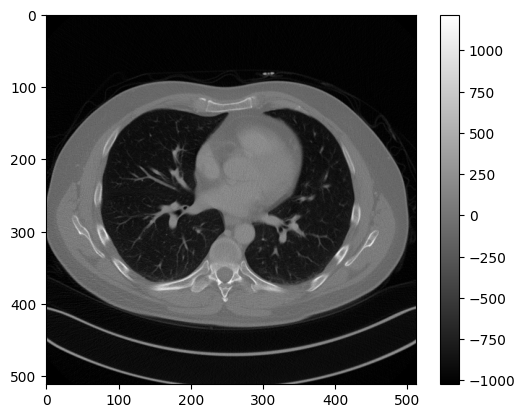

In [2]:
img = np.load(npfiles[0])
print(npfiles[0])
plt.imshow(img, cmap='gray')
plt.colorbar()

In [3]:
img.std()

464.6921933268496

Text(0.5, 1.0, 'mean: 63.74 | std: 99.96')

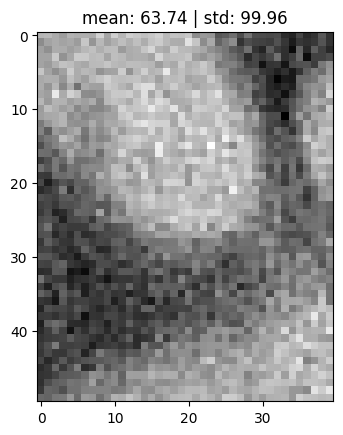

In [4]:
subimg = img[200:250, 210:250]
plt.imshow(subimg, cmap='gray')
plt.title(f'mean: {subimg.mean():0.2f} | std: {subimg.std():0.2f}')

These stds seem high, check with the L

Note that the training images have been normalized from [-1024, 3072] to [0, 0.5]

Update: normalization removed, should be native [-1024, 3072]

## Check that the dataloader is working as expected

In [5]:
import sys
sys.path.append('..')
from loader import get_loader
get_loader?

Signature:
get_loader(
    mode='train',
    load_mode=0,
    saved_path=None,
    test_patient='L506',
    patch_n=None,
    patch_size=None,
    transform=None,
    batch_size=32,
    num_workers=6,
)
Docstring: <no docstring>
File:      ~/Dev/forks/RED-CNN/loader.py
Type:      function

In [6]:
np_path = '/gpfs_projects/brandon.nelson/Mayo_LDGC/numpy_files'
train_dl = get_loader(mode='train', saved_path=np_path, patch_size=64, patch_n=10)

In [7]:
i = 0
for x, y in train_dl:
    i += 1
    if i > 0:
        break
x.shape, y.shape

(torch.Size([32, 10, 64, 64]), torch.Size([32, 10, 64, 64]))

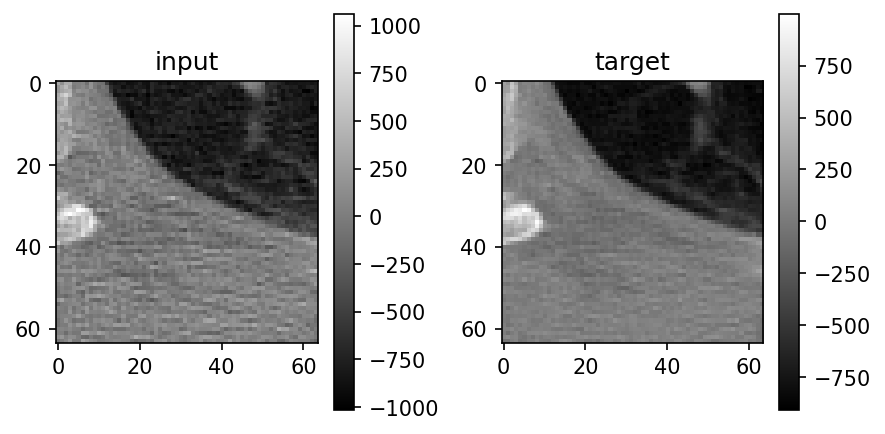

In [8]:
import matplotlib.pyplot as plt
f = plt.figure(figsize=(6,3), dpi=150)
ax = plt.subplot(1,2,1)
im = ax.imshow(x[0, 0], cmap='gray')
plt.title('input')
plt.colorbar(im)
ax = plt.subplot(1,2, 2)
im = ax.imshow(y[0, 0], cmap='gray')
plt.colorbar(im)
plt.title('target')
plt.tight_layout()

## See how the training data histograms compare to the processed training data files and test data

In [9]:
from pathlib import Path

In [10]:
img_path = Path('/gpfs_projects/brandon.nelson/Mayo_LDGC/images')
raw_images = list((img_path/'L506').rglob('*.IMA')) #L506 the test case

input_images = [f for f in raw_images if 'quarter_3mm' in str(f)]
target_images = [f for f in raw_images if f not in input_images]
input_images.sort()
target_images.sort()

import pydicom
import numpy as np

image_list = []

for fname in input_images:
  dcm_file = pydicom.read_file(fname)
  image_list.append(dcm_file.pixel_array.astype('float32') + float(dcm_file.RescaleIntercept))
image_list = np.array(image_list)

## Look at all of the training pairs in a batch

In [11]:
import numpy as np
from PIL import Image

def pil_grid(images, max_horiz=np.iinfo(int).max):
    n_images = len(images)
    n_horiz = min(n_images, max_horiz)
    h_sizes, v_sizes = [0] * n_horiz, [0] * (n_images // n_horiz)
    for i, im in enumerate(images):
        h, v = i % n_horiz, i // n_horiz
        h_sizes[h] = max(h_sizes[h], im.size[0])
        v_sizes[v] = max(v_sizes[v], im.size[1])
    h_sizes, v_sizes = np.cumsum([0] + h_sizes), np.cumsum([0] + v_sizes)
    im_grid = Image.new('RGB', (h_sizes[-1], v_sizes[-1]), color='white')
    for i, im in enumerate(images):
        im_grid.paste(im, (h_sizes[i % n_horiz], v_sizes[i // n_horiz]))
    return im_grid

def normalize(image): return 1 - (image.max() - image) / (image.max() - image.min())

In [12]:
y.reshape(-1, 64, 64).numpy().shape

(320, 64, 64)

All training pairs for a single batch shown below as follows:
routine dose (top) `y`
------------------
low dose (bottom) `x`


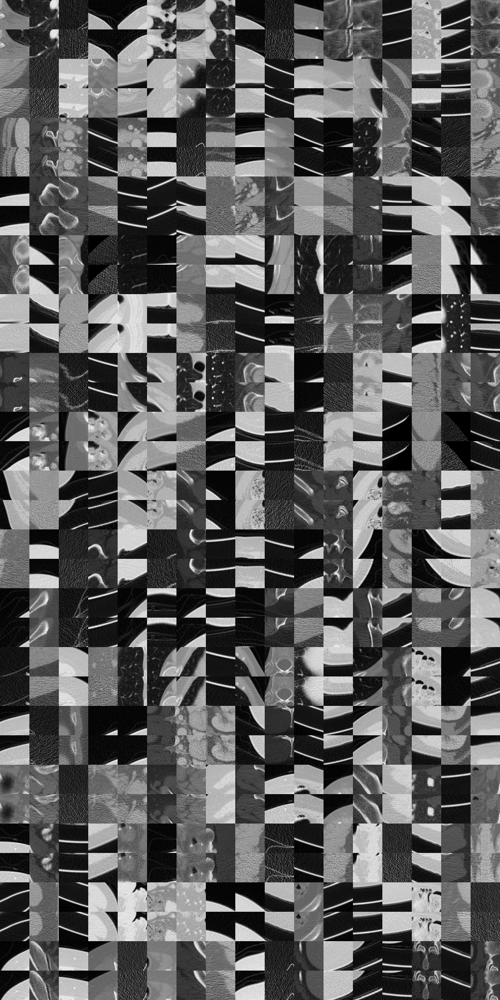

In [13]:
print('All training pairs for a single batch shown below as follows:')
print('routine dose (top) `y`')
print('------------------')
print('low dose (bottom) `x`')
l_images = []
grid_size = 17
N = grid_size**2
for i in range(N):
    image = (normalize(np.concatenate([y.reshape(-1, 64, 64).numpy()[i], x.reshape(-1, 64, 64).numpy()[i]], axis=0))*255).astype('uint8')
    l_images.append(Image.fromarray(image))
pil_grid(l_images, grid_size)

learly the patietnt table was in a lot fof the traini exampsles..

In [14]:
train_noise = x - y

In [15]:
x.dtype, y.dtype, train_noise.dtype

(torch.int16, torch.int16, torch.int16)

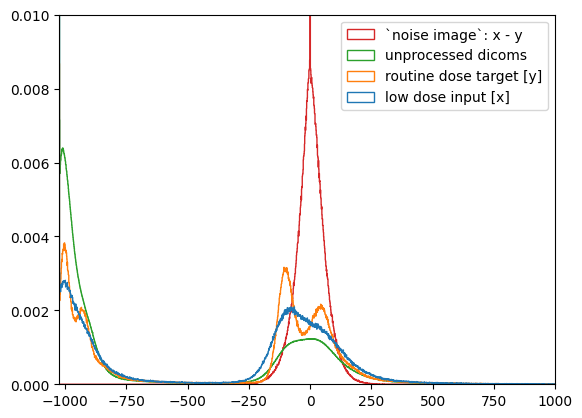

In [16]:
plt.hist([x.ravel(), y.ravel(), image_list.ravel(), train_noise.ravel()], label = ['low dose input [x]', 'routine dose target [y]', 'unprocessed dicoms', '`noise image`: x - y'], bins=4096, density=True, histtype='step')
plt.legend()
plt.ylim([0, 0.01])
plt.xlim([-1024, 1000])
plt.show()

^ This confirms that there was no scaling done to the training data

## Now what does the noise histograms look like and how does this compare to our noise patches? 
Note: Two sets of images amay have the sae histogram statistics but wildly different textures (give exmaple of this, because histograms have no spatial awareness, whereas NPS does)

In [17]:
noise_patch_dir = Path('/home/brandon.nelson/Dev/PediatricCTSizeAugmentation/noise_patches/patch_size_64x64')
diameters = [112, 131, 151, 185, 216, 292]

noise_files = [noise_patch_dir / f'diameter{d}mm.npy' for d in diameters]
noise_patch_dict = {f.stem: np.load(f)[:100] for f in noise_files}
noise_patches = np.concatenate(list(noise_patch_dict.values()))

In [18]:
[len(o) for o in noise_patch_dict.values()]

[100, 100, 100, 100, 100, 100]

In [19]:
noise_diam = np.load(noise_patch_dir / 'diameter292mm.npy')
noise_diam.shape

(30000, 64, 64)

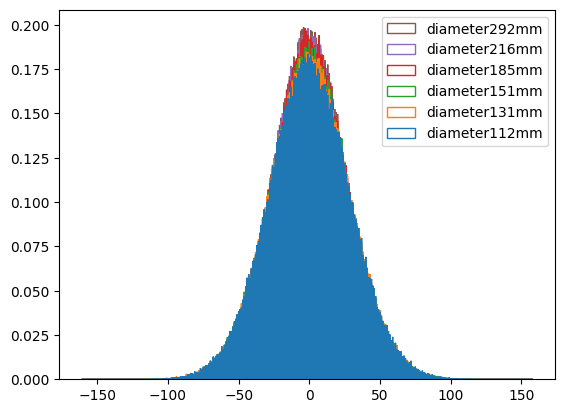

In [20]:
plt.hist([noise_patch_dict[o].ravel() for o in sorted(noise_patch_dict.keys())], bins=4096, label=list(sorted(noise_patch_dict.keys())), density=True, histtype='step')
plt.legend()

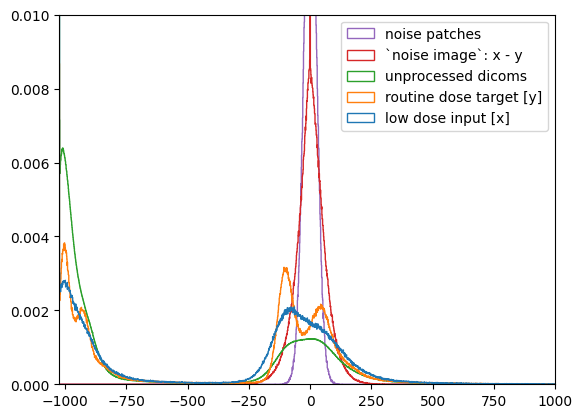

In [21]:
plt.hist([x.ravel(), y.ravel(), image_list.ravel(), train_noise.ravel(), noise_patch_dict['diameter292mm'].ravel()], label = ['low dose input [x]', 'routine dose target [y]', 'unprocessed dicoms', '`noise image`: x - y', 'noise patches'], bins=4096, density=True, histtype='step')
plt.legend()
plt.ylim([0, 0.01])
plt.xlim([-1024, 1000])
plt.show()

In [22]:
normalized_patches = noise_patch_dict['diameter292mm']/noise_patch_dict['diameter292mm'].std()*train_noise.numpy().std()

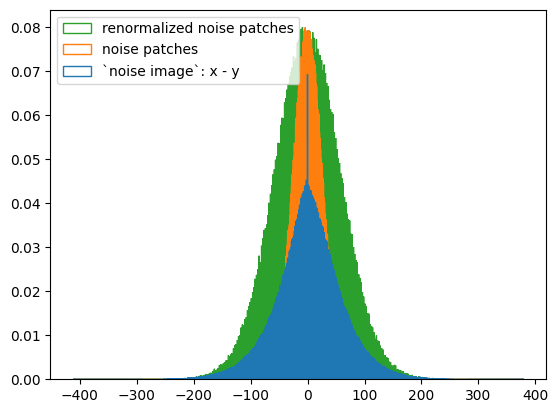

In [23]:
plt.hist([train_noise.ravel(), noise_patch_dict['diameter292mm'].ravel(), normalized_patches.ravel()], label = ['`noise image`: x - y', 'noise patches', 'renormalized noise patches'], bins=4096, density=True, histtype='step')
plt.legend()
plt.show()

In [24]:
train_noise.shape

torch.Size([32, 10, 64, 64])

In [25]:
train_noise.numpy().mean(axis=(0, 1)).shape

(64, 64)

In [26]:
normalized_patches.std(), train_noise.numpy().std()

(59.56533793863095, 59.56533793863095)

In [27]:
noise_patch_dict['diameter292mm'].reshape(100, 64, 64, 1).shape, train_noise.reshape(-1, 64, 64, 1).shape

((100, 64, 64, 1), torch.Size([320, 64, 64, 1]))

In [28]:
from skimage.exposure import match_histograms, histogram

input_shape = noise_patch_dict['diameter292mm'].shape

input_images = noise_patch_dict['diameter292mm'].reshape(-1, 1)
ref_images = train_noise.reshape(-1, 1).numpy()

print(input_images.shape, ref_images.shape)

equal_hist_patches = {diam: match_histograms(input_images.reshape(-1, 1), reference=ref_images).reshape(input_shape) for diam, input_images in noise_patch_dict.items()}

[o.shape for o in equal_hist_patches.values()]

(409600, 1) (1310720, 1)


[(100, 64, 64),
 (100, 64, 64),
 (100, 64, 64),
 (100, 64, 64),
 (100, 64, 64),
 (100, 64, 64)]

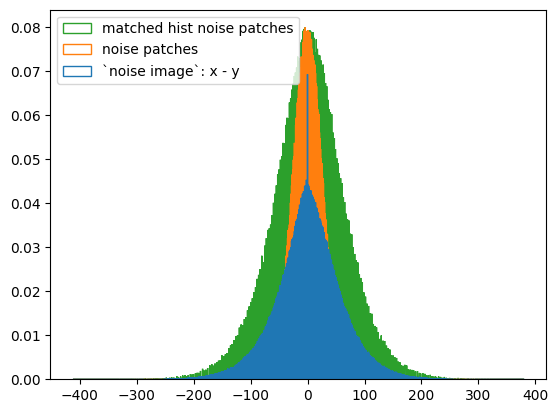

In [29]:
plt.hist([train_noise.ravel(), noise_patch_dict['diameter292mm'].ravel(), equal_hist_patches['diameter292mm'].ravel()], label = ['`noise image`: x - y', 'noise patches', 'matched hist noise patches'], bins=4096, density=True, histtype='step')
plt.legend()
plt.show()

In [30]:
from skimage.exposure import cumulative_distribution

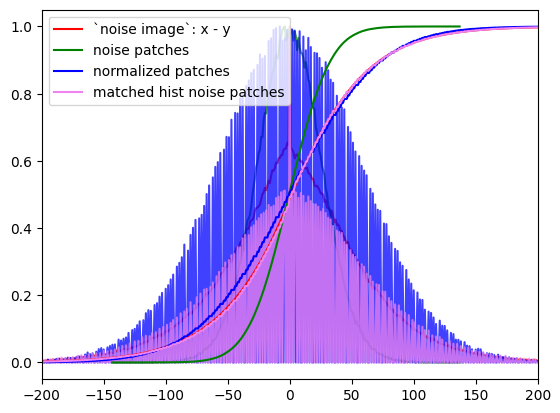

In [31]:
for dist_type in['pdf', 'cdf']:
    for img, lbl, style in zip([train_noise.numpy().ravel(), noise_patch_dict['diameter292mm'].ravel(), normalized_patches.ravel(), equal_hist_patches['diameter292mm'].ravel()], ['`noise image`: x - y', 'noise patches', 'normalized patches', 'matched hist noise patches'], ['red', 'green', 'blue','violet']):
        img = img.astype('int16')
        if dist_type == 'pdf':
            img_hist, hbins = histogram(img)
            plt.plot(hbins, img_hist/ img_hist.max(), color=style, alpha=0.75)
        else:
            cdf, cbins = cumulative_distribution(img)
            plt.plot(cbins, cdf, color=style, label=lbl)
plt.xlim([-200, 200])
plt.legend()
plt.show()

In [32]:
print(train_noise.numpy().std())

[equal_hist_patches[d].std() for d in equal_hist_patches]

59.56533793863095


[59.55293117724366,
 59.55662030665005,
 59.55666840149255,
 59.560582794998595,
 59.55846677388973,
 59.558898092456026]

In [33]:
[o.std() for o in noise_patch_dict.values()]

[28.988725443000448,
 28.551623368405817,
 28.30179026555275,
 27.177563399484026,
 26.999144218862625,
 26.574320210726576]

Nwxt look at the noise patches in trhe training set to understand the difference in hist (higher rorder)

All training noise:


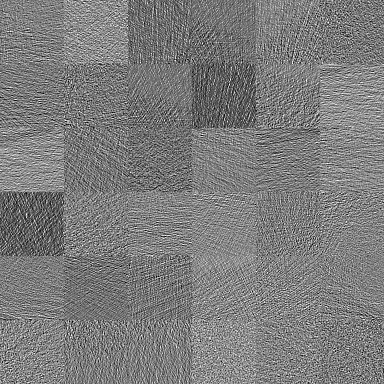

In [34]:
print('All training noise:')
l_images = []
grid_size = 6
N = grid_size**2
for i in range(N):
    image = (normalize(np.concatenate([train_noise.reshape(-1, 64, 64).numpy()[i]], axis=0))*255).astype('uint8')
    l_images.append(Image.fromarray(image))
pil_grid(l_images, grid_size)

All generated noise patches:
diameter112mm
diameter131mm
diameter151mm
diameter185mm
diameter216mm
diameter292mm


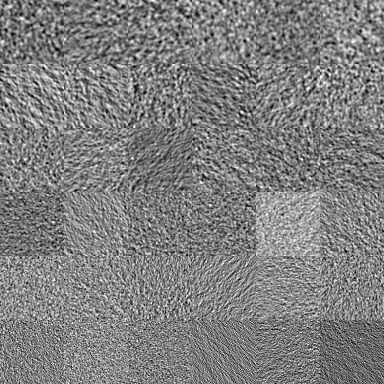

In [35]:
print('All generated noise patches:')
l_images = []
grid_size = len(noise_patch_dict)
N = grid_size**2
for diam in noise_patch_dict:
    print(diam)
    for i in range(grid_size):
        image = (normalize(np.concatenate([noise_patch_dict[diam][i]], axis=0))*255).astype('uint8')
        l_images.append(Image.fromarray(image))
pil_grid(l_images, grid_size)

Histogram matched noise patches:
diameter112mm
diameter131mm
diameter151mm
diameter185mm
diameter216mm
diameter292mm


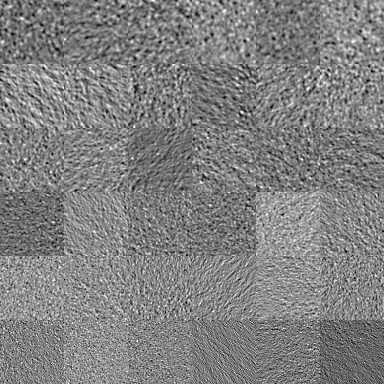

In [36]:
print('Histogram matched noise patches:')
l_images = []
grid_size = len(noise_patch_dict)
N = grid_size**2
for diam in noise_patch_dict:
    print(diam)
    for i in range(grid_size):
        image = (normalize(np.concatenate([equal_hist_patches[diam][i]], axis=0))*255).astype('uint8')
        l_images.append(Image.fromarray(image))
pil_grid(l_images, grid_size)

As we saw above these nmoise patches look quite differ ent by row but all have the same histogram

Now look at the frequency components 

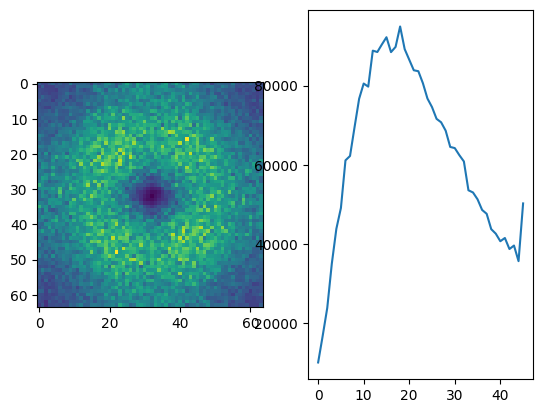

In [37]:
def compute_nps(image):

  if image.ndim == 2:
    image = image[None, :, :]

  if image.ndim == 4:
    image = image[:,:,:,0]

  nsize = image.shape
  nrealization = nsize[0]
  if image.ndim == 3:
    nps = np.zeros((nsize[1],nsize[2]))
    for i in range(nrealization):
      s = np.fft.fftshift(np.fft.fft2(image[i]))
      nps = np.abs(s)**2 + nps
    nps = nps/(nsize[1]*nsize[2])
  else:
    raise ValueError(f'Image of dimension {image.ndim} Not implemented!')
  return nps


def radial_profile(data, center=None):
    center = center or (data.shape[0]/2, data.shape[1]/2)
    y, x = np.indices((data.shape))
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(int)

    tbin = np.bincount(r.ravel(), data.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr
    return radialprofile

nps = compute_nps(noise_patch_dict['diameter292mm'])
nps_1d = radial_profile(nps)

f, axs = plt.subplots(1,2)
axs[0].imshow(nps)
axs[1].plot(nps_1d)

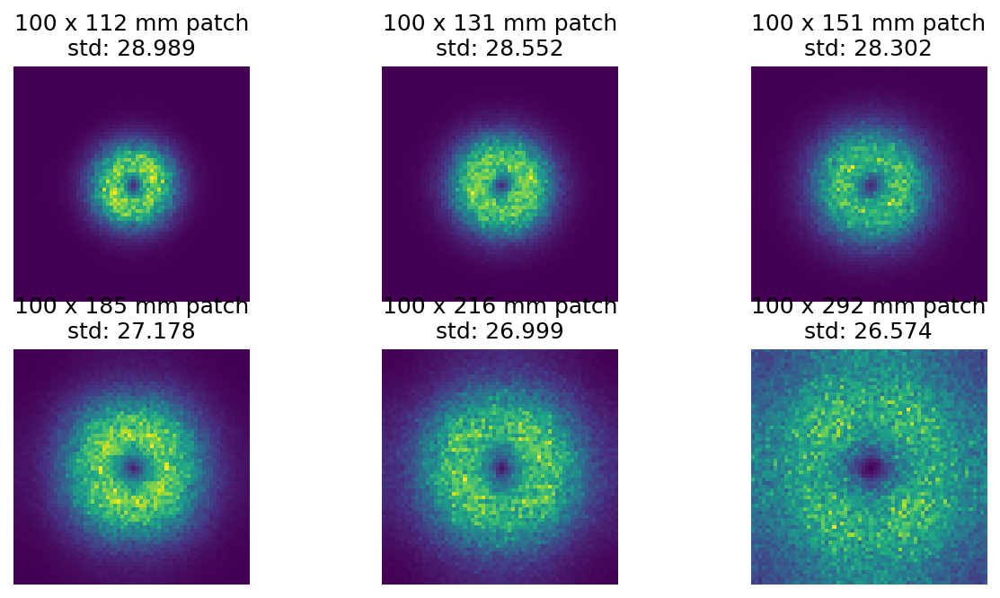

In [41]:
f, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(10, 5), dpi=150)
for d, ax in zip(diameters, axs.flatten()):
    patches = noise_patch_dict[f'diameter{d}mm']
    nps = compute_nps(patches)
    ax.imshow(nps)
    ax.axis('off')
    ax.set_title(f'{len(patches)} x {d} mm patch\nstd: {patches.std():3.3f}')

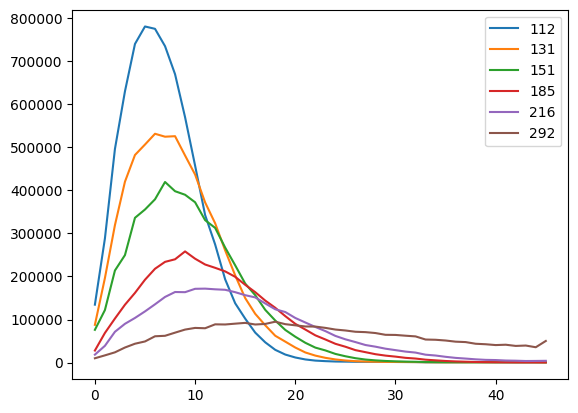

In [42]:
for d, ax in zip(diameters, axs.flatten()):
    patches = noise_patch_dict[f'diameter{d}mm']
    nps = compute_nps(patches)
    nps_1d = radial_profile(nps)
    plt.plot(nps_1d, label=d)
plt.legend()
plt.show()

In [43]:
for d, ax in zip(diameters[::2], axs.flatten()):
    patches = noise_patch_dict[f'diameter{d}mm']
    nps = compute_nps(patches)
    nps_1d = radial_profile(nps)
    plt.plot(nps_1d, label=f'{d} mm original')

    patches = equal_hist_patches[f'diameter{d}mm']
    nps = compute_nps(patches)
    nps_1d = radial_profile(nps)
    plt.plot(nps_1d, label=f'{d} mm hist matched', marker='*')
plt.legend()
plt.show()

SyntaxError: invalid syntax (343897885.py, line 10)

: 

In [ ]:
noise_patches = np.concatenate(list(equal_hist_patches.values()))

All training pairs for a single batch shown below as follows:
routine dose (top) `y`
------------------
low dose (middle) `x`
------------------
noise augmented (bottom) `x`=y + noise_patch`


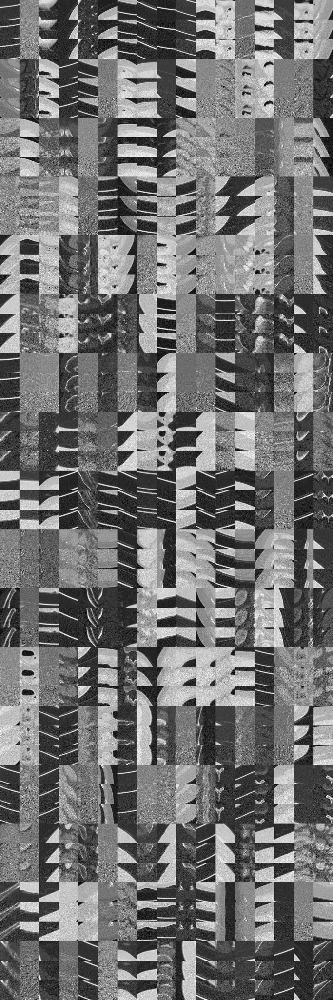

In [ ]:
print('All training pairs for a single batch shown below as follows:')
print('routine dose (top) `y`')
print('------------------')
print('low dose (middle) `x`')
print('------------------')
print('noise augmented (bottom) `x`=y + noise_patch`')
l_images = []
grid_size = 17
N = grid_size**2
for i in range(N):
    noise_patch = noise_patches[np.random.choice(list(range(len(noise_patches))))]
    image = (normalize(np.concatenate([y.reshape(-1, 64, 64).numpy()[i], x.reshape(-1, 64, 64).numpy()[i], y.reshape(-1, 64, 64).numpy()[i]+noise_patch], axis=0))*255).astype('uint8')
    l_images.append(Image.fromarray(image))
pil_grid(l_images, grid_size)